In [18]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns #visualisation
from scipy import stats

from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor


import chart_studio.plotly as py
import plotly.offline as pyo
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import *
from plotly.tools import FigureFactory as FF

init_notebook_mode(connected=True)
sns.set(color_codes=True)

In [19]:
## Import all the quarter 2 data
q2_2018 = pd.read_csv('Divvy_Trips_2018_Q2.csv')
q2_2017 = pd.read_csv('Divvy_Trips_2017_Q2.csv')
q2_2016_4 = pd.read_csv('Divvy_Trips_2016_04.csv')
q2_2016_5 = pd.read_csv('Divvy_Trips_2016_05.csv')
q2_2016_6 = pd.read_csv('Divvy_Trips_2016_06.csv')
q2_2015 = pd.read_csv('Divvy_Trips_2015-Q2.csv')

In [20]:
## Concat the 2016 data into one df
q2_2016 = pd.concat([q2_2016_4, q2_2016_5, q2_2016_6])

In [21]:
## Rename columns to match others
q2_2015.rename(columns={'starttime':'start_time', 'stoptime':'end_time'}, inplace=True)
q2_2016.rename(columns={'starttime':'start_time', 'stoptime':'end_time'}, inplace=True)

In [22]:
q2_2015.info()
q2_2016.info()
q2_2017.info()
q2_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 893890 entries, 0 to 893889
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   trip_id            893890 non-null  int64  
 1   start_time         893890 non-null  object 
 2   end_time           893890 non-null  object 
 3   bikeid             893890 non-null  int64  
 4   tripduration       893890 non-null  int64  
 5   from_station_id    893890 non-null  int64  
 6   from_station_name  893890 non-null  object 
 7   to_station_id      893890 non-null  int64  
 8   to_station_name    893890 non-null  object 
 9   usertype           893890 non-null  object 
 10  gender             592553 non-null  object 
 11  birthyear          592565 non-null  float64
dtypes: float64(1), int64(5), object(6)
memory usage: 81.8+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1072827 entries, 0 to 477872
Data columns (total 12 columns):
 #   Column             Non-

In [23]:
## Concatenate all 4 years of data
q2 = pd.concat([q2_2015, q2_2016, q2_2017, q2_2018])

In [24]:
q2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4146212 entries, 0 to 1059680
Data columns (total 12 columns):
 #   Column             Dtype  
---  ------             -----  
 0   trip_id            int64  
 1   start_time         object 
 2   end_time           object 
 3   bikeid             int64  
 4   tripduration       object 
 5   from_station_id    int64  
 6   from_station_name  object 
 7   to_station_id      int64  
 8   to_station_name    object 
 9   usertype           object 
 10  gender             object 
 11  birthyear          float64
dtypes: float64(1), int64(4), object(7)
memory usage: 411.2+ MB


In [25]:
## Find the number of check-outs per station
station_counts_from = pd.DataFrame(q2['from_station_id'].value_counts())
## Top 5 Stations with the most check-outs
station_counts_from.head()

,from_station_id
35,100085
76,63293
177,53591
268,53260
91,51871


In [26]:
## Find the number of check-ins per station
station_counts_to= pd.DataFrame(q2['to_station_id'].value_counts())
## Top 5 stations with the most check-ins
station_counts_to.head()

,to_station_id
35,113731
268,61225
76,58945
177,58246
90,49645


In [27]:
## Create a DataFrame with the check-outs and check-ins
## Create a columns that sums check-outs and check-ins
station_counts = pd.concat([station_counts_from, station_counts_to], axis=1)
station_counts.rename(columns={'from_station_id':'checkouts', 'to_station_id':'checkins'}, inplace=True)
station_counts['total'] = station_counts['checkouts'] + station_counts['checkins']
station_counts.head()

,checkouts,checkins,total
2,19636,18114,37750
3,32516,30400,62916
4,23385,23742,47127
5,9818,10125,19943
6,24221,21159,45380


In [28]:
## After some research, we will use the top 26 stations
## The top 26 stations have a total > 50,000
station_counts_26 = station_counts.sort_values('total', ascending=False).head(26)
stations = list(station_counts_26.index)
print(stations)
station_counts_26.head()

[35, 76, 268, 177, 91, 192, 85, 90, 77, 174, 43, 287, 133, 3, 81, 195, 26, 255, 75, 52, 283, 289, 94, 199, 110, 176]


,checkouts,checkins,total
35,100085,113731,213816
76,63293,58945,122238
268,53260,61225,114485
177,53591,58246,111837
91,51871,47773,99644


In [29]:
## Extract just trips that involve the 26 stations in the model
q2_stations = q2[(q2['from_station_id'].isin(stations)) | (q2['to_station_id'].isin(stations))]
q2_stations.head()

,trip_id,start_time,end_time,bikeid,tripduration,from_station_id,from_station_name,to_station_id,to_station_name,usertype,gender,birthyear
5,5943494,6/30/2015 23:57,7/1/2015 0:11,4293,865,43,Michigan Ave & Washington St,59,Wabash Ave & Roosevelt Rd,Subscriber,Female,1993.0
6,5943493,6/30/2015 23:57,7/1/2015 0:35,521,2285,43,Michigan Ave & Washington St,59,Wabash Ave & Roosevelt Rd,Subscriber,Male,1993.0
7,5943492,6/30/2015 23:57,7/1/2015 0:16,581,1156,43,Michigan Ave & Washington St,57,Clinton St & Roosevelt Rd,Subscriber,Male,1994.0
8,5943490,6/30/2015 23:56,7/1/2015 0:16,2605,1199,43,Michigan Ave & Washington St,57,Clinton St & Roosevelt Rd,Subscriber,Male,1993.0
10,5943488,6/30/2015 23:56,7/1/2015 0:35,1198,2311,43,Michigan Ave & Washington St,59,Wabash Ave & Roosevelt Rd,Subscriber,Male,1993.0


In [30]:
## Explore the number of trips overall and in our model

total_trip_count = q2['trip_id'].count()
top_26_count = q2_stations['trip_id'].count()
percent = round(top_26_count/total_trip_count, 3) * 100

print("Of the {} total trips, {} involve one of our 26 stations. That's {}%".format(total_trip_count, 
                                                                                    top_26_count,
                                                                                    percent))

Of the 4146212 total trips, 1638465 involve one of our 26 stations. That's 39.5%


In [31]:
## Convert the 'start_time' column to a datetime object
q2_stations['start_time'] = pd.to_datetime(q2_stations['start_time'])

<ipython-input-31-3e751d922263>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [32]:
## Begin creating the DataFrame for the model to be used
q2_model = q2_stations[['start_time', 'end_time', 'from_station_id', 'to_station_id']]
q2_model.info()
q2_model.head(3)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1638465 entries, 5 to 1059680
Data columns (total 4 columns):
 #   Column           Non-Null Count    Dtype         
---  ------           --------------    -----         
 0   start_time       1638465 non-null  datetime64[ns]
 1   end_time         1638465 non-null  object        
 2   from_station_id  1638465 non-null  int64         
 3   to_station_id    1638465 non-null  int64         
dtypes: datetime64[ns](1), int64(2), object(1)
memory usage: 62.5+ MB


,start_time,end_time,from_station_id,to_station_id
5,2015-06-30 23:57:00,7/1/2015 0:11,43,59
6,2015-06-30 23:57:00,7/1/2015 0:35,43,59
7,2015-06-30 23:57:00,7/1/2015 0:16,43,57


In [33]:
q2_model['start_time'] = pd.to_datetime(q2_model['start_time'])


<ipython-input-33-5d5cc9afa348>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [34]:
## Make the 'start_time' the index
q2_model.index = q2_model['start_time']
q2_model.drop('start_time', axis=1, inplace=True)

/opt/anaconda3/lib/python3.8/site-packages/pandas/core/frame.py:3990: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [35]:
## Create a column of the day name (ie. Sunday, Monday, Tuesday)
q2_model['day'] = q2_model.index.day_name()

<ipython-input-35-2eda2cc9ff21>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [36]:
## Add the year (2015-2018)
## Add the hour of day (0-23)

q2_model['year'] = q2_model.index.map(lambda x:str(x)[:4])
q2_model['hour'] = q2_model.index.map(lambda x:str(x)[11:13])

<ipython-input-36-2549bbbe4765>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-36-2549bbbe4765>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [37]:
q2_model.head(2)

,end_time,from_station_id,to_station_id,day,year,hour
start_time,,,,,,
2015-06-30 23:57:00,7/1/2015 0:11,43,59,Tuesday,2015,23
2015-06-30 23:57:00,7/1/2015 0:35,43,59,Tuesday,2015,23


In [38]:
## Create columns in both DataFrames to merge on
## This is the date down the hour

q2_model['merge_col'] = q2_model.index.map(lambda x:str(x)[:13])

<ipython-input-38-fbf217eb5282>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [39]:
## Rearrange columns to set the new 'merge_cols' as the index for each df

q2_model['start_time'] = q2_model.index 
q2_model.index = q2_model['merge_col']

<ipython-input-39-a400d9fc5774>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [40]:
q2_model.head(2)

,end_time,from_station_id,to_station_id,day,year,hour,merge_col,start_time
merge_col,,,,,,,,
2015-06-30 23,7/1/2015 0:11,43,59,Tuesday,2015,23,2015-06-30 23,2015-06-30 23:57:00
2015-06-30 23,7/1/2015 0:35,43,59,Tuesday,2015,23,2015-06-30 23,2015-06-30 23:57:00


In [41]:
## Make 'start_time' index
## Rename rain and snow columns

q2_model.index = q2_model['start_time']

In [42]:
q2_model.head(2)

,end_time,from_station_id,to_station_id,day,year,hour,merge_col,start_time
start_time,,,,,,,,
2015-06-30 23:57:00,7/1/2015 0:11,43,59,Tuesday,2015,23,2015-06-30 23,2015-06-30 23:57:00
2015-06-30 23:57:00,7/1/2015 0:35,43,59,Tuesday,2015,23,2015-06-30 23,2015-06-30 23:57:00


In [43]:
## Sum the number of check-outs by station by day by hour

q2_model_from_counts = pd.DataFrame(q2_model.groupby(['from_station_id', 'day', 'hour'])['year'].count())
q2_model_from_counts.head()


year
from_station_id day    hour      
2               Friday 00       1
                       05       3
                       06       4
                       07      16
                       08      28

In [44]:
## Reset the index to fill in each row with the station name, day, hour and check-out count
q2_model_from_counts.reset_index()

,from_station_id,day,hour,year
0,2,Friday,00,1
1,2,Friday,05,3
2,2,Friday,06,4
3,2,Friday,07,16
4,2,Friday,08,28
...,...,...,...,...
40608,627,Wednesday,18,17
40609,627,Wednesday,19,5
40610,627,Wednesday,20,6
40611,627,Wednesday,21,4


In [45]:
# Preprocess to get Dataframe for Checkouts
## Only get the instances where the check-out station is one of the top 26

checkouts = q2_model[q2_model['from_station_id'].isin(stations)]

In [46]:
checkouts.head(2)

,end_time,from_station_id,to_station_id,day,year,hour,merge_col,start_time
start_time,,,,,,,,
2015-06-30 23:57:00,7/1/2015 0:11,43,59,Tuesday,2015,23,2015-06-30 23,2015-06-30 23:57:00
2015-06-30 23:57:00,7/1/2015 0:35,43,59,Tuesday,2015,23,2015-06-30 23,2015-06-30 23:57:00


In [47]:
## Add the month of the ride as well (ie. April, May, June)
checkouts['month'] = checkouts.index.map(lambda x:str(x)[5:7])

<ipython-input-47-b6bdda4ad626>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [48]:
## Create column down to the hour to be able to sum the check-outs by hour

checkouts['groupby_col'] = checkouts.index.map(lambda x:str(x)[:13])

<ipython-input-48-66ae06703c5a>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [49]:
checkouts.head(3)

,end_time,from_station_id,to_station_id,day,year,hour,merge_col,start_time,month,groupby_col
start_time,,,,,,,,,,
2015-06-30 23:57:00,7/1/2015 0:11,43,59,Tuesday,2015,23,2015-06-30 23,2015-06-30 23:57:00,06,2015-06-30 23
2015-06-30 23:57:00,7/1/2015 0:35,43,59,Tuesday,2015,23,2015-06-30 23,2015-06-30 23:57:00,06,2015-06-30 23
2015-06-30 23:57:00,7/1/2015 0:16,43,57,Tuesday,2015,23,2015-06-30 23,2015-06-30 23:57:00,06,2015-06-30 23


In [50]:
## Sum the number of check-outs by station and hour (using the groupby_col column)

checkouts_model = pd.DataFrame(checkouts.groupby(['from_station_id', 'groupby_col'])['hour'].count())

## Rename the 'hour' to 'checkout_count'
## Make the 'grouby_col' the index

checkouts_model.rename(columns={'hour':'checkout_count'}, inplace=True)
checkouts_model.reset_index(inplace=True)
checkouts_model.index = checkouts_model['groupby_col']

checkouts_model.head(2)

,from_station_id,groupby_col,checkout_count
groupby_col,,,
2015-04-24 14,3,2015-04-24 14,2
2015-04-24 15,3,2015-04-24 15,1


In [51]:
## Add the year, month and hour columns

checkouts_model['year'] = checkouts_model.index.map(lambda x:str(x)[:4])
checkouts_model['month'] = checkouts_model.index.map(lambda x:str(x)[5:7])
checkouts_model['hour'] = checkouts_model.index.map(lambda x:str(x)[11:13])
checkouts_model.head(3)

,from_station_id,groupby_col,checkout_count,year,month,hour
groupby_col,,,,,,
2015-04-24 14,3,2015-04-24 14,2,2015,04,14
2015-04-24 15,3,2015-04-24 15,1,2015,04,15
2015-04-24 16,3,2015-04-24 16,8,2015,04,16


In [52]:
checkouts_model['groupby_col'] = pd.to_datetime(checkouts_model['groupby_col'])
checkouts_model.index = checkouts_model['groupby_col']

In [53]:
checkouts_model.head(3)

,from_station_id,groupby_col,checkout_count,year,month,hour
groupby_col,,,,,,
2015-04-24 14:00:00,3,2015-04-24 14:00:00,2,2015,04,14
2015-04-24 15:00:00,3,2015-04-24 15:00:00,1,2015,04,15
2015-04-24 16:00:00,3,2015-04-24 16:00:00,8,2015,04,16


In [54]:
## Add the day of week

checkouts_model['day'] = checkouts_model.index.day_name()
checkouts_model.head(3)

,from_station_id,groupby_col,checkout_count,year,month,hour,day
groupby_col,,,,,,,
2015-04-24 14:00:00,3,2015-04-24 14:00:00,2,2015,04,14,Friday
2015-04-24 15:00:00,3,2015-04-24 15:00:00,1,2015,04,15,Friday
2015-04-24 16:00:00,3,2015-04-24 16:00:00,8,2015,04,16,Friday


In [55]:
checkouts_model.drop('groupby_col', axis=1, inplace=True)
checkouts_model.head(3)

,from_station_id,checkout_count,year,month,hour,day
groupby_col,,,,,,
2015-04-24 14:00:00,3,2,2015,04,14,Friday
2015-04-24 15:00:00,3,1,2015,04,15,Friday
2015-04-24 16:00:00,3,8,2015,04,16,Friday


In [56]:
cols = checkouts_model.columns.tolist()


In [57]:
new_cols = ['checkout_count','from_station_id','year','month','hour','day']

In [58]:
checkouts_model = checkouts_model[new_cols]
checkouts_model.head(3)

,checkout_count,from_station_id,year,month,hour,day
groupby_col,,,,,,
2015-04-24 14:00:00,2,3,2015,04,14,Friday
2015-04-24 15:00:00,1,3,2015,04,15,Friday
2015-04-24 16:00:00,8,3,2015,04,16,Friday


In [59]:
#Model for predicting Checkouts at a given station

## Convert categorical columns into dummy columns

checkouts_model.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 140122 entries, 2015-04-24 14:00:00 to 2018-06-30 23:00:00
Data columns (total 6 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   checkout_count   140122 non-null  int64 
 1   from_station_id  140122 non-null  int64 
 2   year             140122 non-null  object
 3   month            140122 non-null  object
 4   hour             140122 non-null  object
 5   day              140122 non-null  object
dtypes: int64(2), object(4)
memory usage: 7.5+ MB


In [60]:
## Convert the 'from_station_id' from an int to str

checkouts_model['from_station_id'] = checkouts_model['from_station_id'].apply(str)

In [61]:
## 'from_station_id', 'year', 'month', 'day', 'hour' columns to be converted to dummies

checkouts = pd.get_dummies(data=checkouts_model, columns=['from_station_id', 'year', 'month', 'day', 'hour'])

In [62]:
checkouts.head()

,checkout_count,from_station_id_110,from_station_id_133,from_station_id_174,from_station_id_176,from_station_id_177,from_station_id_192,from_station_id_195,from_station_id_199,from_station_id_255,...,hour_14,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23
groupby_col,,,,,,,,,,,,,,,,,,,,,
2015-04-24 14:00:00,2,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2015-04-24 15:00:00,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2015-04-24 16:00:00,8,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2015-04-24 19:00:00,5,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2015-04-24 20:00:00,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0


In [63]:
checkouts.shape

(140122, 65)

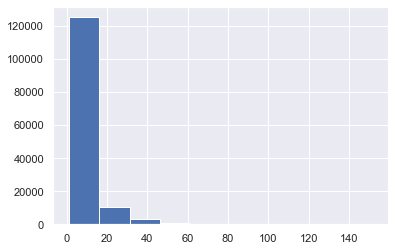

In [64]:
#Analyze the target column

## Histogram to analyze the shape of the target column

plt.hist(checkouts['checkout_count'])
plt.show()

In [65]:
## Find the skew of the check-outs

checkouts['checkout_count'].skew()

#A skew of 0 is a normally distributed, a skew of 3.614 means the data is right skewed.

3.6277735508611952

In [66]:
## Check skew of multiple transformations

log_trans = np.log(checkouts['checkout_count']).skew()
sqrt_trans = (checkouts['checkout_count'] ** .5).skew()
cube_trans = (checkouts['checkout_count'] ** (1/3)).skew()

print('Log Transformation:', log_trans)
print('Square Root Transformation:', sqrt_trans)
print('Cube Root Transformation', cube_trans)

#Our goal is to get the skew as close to 0 as possible, therefore the check-out column will be transformed using a log transformation.

Log Transformation: 0.3551040303627324
Square Root Transformation: 1.633950604359878
Cube Root Transformation 1.1415869176766298


In [67]:
## Transform the check-out values

checkouts['checkout_count(log)'] = np.log(checkouts['checkout_count'])

In [68]:
checkouts.head(3)

,checkout_count,from_station_id_110,from_station_id_133,from_station_id_174,from_station_id_176,from_station_id_177,from_station_id_192,from_station_id_195,from_station_id_199,from_station_id_255,...,hour_15,hour_16,hour_17,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,checkout_count(log)
groupby_col,,,,,,,,,,,,,,,,,,,,,
2015-04-24 14:00:00,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0.693147
2015-04-24 15:00:00,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0.000000
2015-04-24 16:00:00,8,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,2.079442


In [69]:
# LINEAR REGRESSION

In [70]:
## Split the the DataFrame into a training and testing sets
## The testing set will be the last two weeks of June

training = checkouts[:100831]
testing = checkouts[100831:]

In [71]:
## Splitting the training and testing data into x and y values

y_train = training['checkout_count(log)']
x_train = training.drop(['checkout_count', 'checkout_count(log)'], axis=1)

y_test = testing['checkout_count(log)']
x_test = testing.drop(['checkout_count', 'checkout_count(log)'], axis=1)
x_train.shape

(100831, 64)

In [72]:
y_test.shape

(39291,)

In [73]:
## Initiate a Lasso Regression
## After some trial and error, an alpha of .00005 was decided upon
## Fit and predict

lasso = Lasso(alpha = .00005, normalize = True)
lasso.fit(x_train, y_train)
lasso_predictions = lasso.predict(x_test)

In [74]:
## Lasso Regression metrics

# Mean Squared Error
lasso_mse = mean_squared_error(np.e ** y_test, np.e ** lasso_predictions)

# r2 score
lasso_r2 = r2_score(np.e ** y_test, np.e ** lasso_predictions)

# Mean Absolute Error
lasso_mean_ae = mean_absolute_error(np.e ** y_test, np.e ** lasso_predictions)

# Median Absolute Error
lasso_median_ae = median_absolute_error(np.e ** y_test, np.e ** lasso_predictions)

In [75]:
print('Mean Squared Error =', lasso_mse)
print('r2 =', lasso_r2)
print('Mean Absolute Error =', lasso_mean_ae)
print('Median Absolute Error =', lasso_median_ae)

Mean Squared Error = 67.1887329655261
r2 = 0.09288709405593254
Mean Absolute Error = 4.072117389982428
Median Absolute Error = 2.057130572649152


In [76]:
## Initiate a Ridge Regression with an alpha of .00001
## Fit and predict

ridgeReg = Ridge(alpha=.00001, normalize=True)
ridgeReg.fit(x_train, y_train)
ridge_preds = ridgeReg.predict(x_test)

In [77]:
## Ridge Regression Metrics

# Mean Squared Error
ridge_mse = mean_squared_error(np.e ** y_test, np.e ** ridge_preds)

# r2 score
ridge_r2 = r2_score(np.e ** y_test, np.e ** ridge_preds)

# Mean Absolute Error
ridge_mean_ae = mean_absolute_error(np.e ** y_test, np.e ** ridge_preds)

# Median Absolute Error
ridge_median_ae = median_absolute_error(np.e ** y_test, np.e ** ridge_preds)

In [78]:
print('Mean Squared Error =', ridge_mse)
print('r2 =', ridge_r2)
print('Mean Absolute Error =', ridge_mean_ae)
print('Median Absolute Error =', ridge_median_ae)

Mean Squared Error = 65.11304671172086
r2 = 0.12091086688825425
Mean Absolute Error = 4.057453718231223
Median Absolute Error = 2.135790575247708


In [79]:
## Train a Decision Tree and predict

dt = DecisionTreeRegressor()
regr_1 = DecisionTreeRegressor(max_depth=31)
regr_1.fit(x_train, y_train)
dt_pred1 = regr_1.predict(x_test)

In [80]:
## Decision Tree metrics

# Mean Squared Error
dt1_mse = mean_squared_error(np.e ** y_test, np.e ** dt_pred1)

# r2 score
dt1_r2 = r2_score(np.e ** y_test, np.e ** dt_pred1)

# Mean Absolute Error
mean_ae = mean_absolute_error(np.e ** y_test, np.e ** dt_pred1)

# Median Absolute Error
median_ae = median_absolute_error(np.e ** y_test, np.e ** dt_pred1)

In [81]:
print('Mean Squared Error =', dt1_mse)
print('r2 =', dt1_r2)
print('Mean Absolute Error =', mean_ae)
print('Median Absolute Error =', median_ae)

Mean Squared Error = 62.90206791429327
r2 = 0.15076121996671332
Mean Absolute Error = 4.13778105050415
Median Absolute Error = 1.944372393410302


In [82]:
## Train a Random Forest and predict

rf = RandomForestRegressor(n_estimators=15)
rf.fit(x_train, y_train)
rf_preds = rf.predict(x_test)

In [83]:
## Random Forset metrics

# Mean Squared Error
rf_mse = mean_squared_error(np.e ** y_test, np.e ** rf_preds)

# r2 score
rf_r2 = r2_score(np.e ** y_test, np.e ** rf_preds)

# Mean Absolute Error
rf_mean_ae = mean_absolute_error(np.e ** y_test, np.e ** rf_preds)

# Median Absolute Error
rf_median_ae = median_absolute_error(np.e ** y_test, np.e ** rf_preds)

In [84]:
print('Mean Squared Error =', rf_mse)
print('r2 =', rf_r2)
print('Mean Absolute Error =', rf_mean_ae)
print('Median Absolute Error =', rf_median_ae)

Mean Squared Error = 60.409427035262866
r2 = 0.18441428367923185
Mean Absolute Error = 4.058413851592616
Median Absolute Error = 1.8895617639006757


In [85]:
import plotly.figure_factory as ff
## Create a table to compare the metrics of each model

table_data = [['', 'Lasso Regression', 'Ridge Regression', 'Decision Tree', 'Random Forest'],
             ['Mean Square <br> Error', round(lasso_mse, 4), round(ridge_mse, 4), round(dt1_mse, 4), round(rf_mse,4)],
             ['R2 Score', round(lasso_r2, 4), round(ridge_r2, 4), round(dt1_r2, 4), round(rf_r2, 4)],
             ['Mean Absolute <br> Error', round(lasso_mean_ae, 4), round(ridge_mean_ae, 4), round(mean_ae, 4), round(rf_mean_ae, 4)],
             ['Median Absolute <br> Error', round(lasso_median_ae, 4), round(ridge_median_ae, 4), round(median_ae, 4), round(rf_median_ae, 4)]]

results_table = FF.create_table(table_data, index=True)

/opt/anaconda3/lib/python3.8/site-packages/plotly/tools.py:590: UserWarning:

plotly.tools.FigureFactory.create_table is deprecated. Use plotly.figure_factory.create_table



In [86]:
## Change the colors for a more visually appealing table

results_table['data'][0]['colorscale'] = [[0, '#2d5986'], [0.5, '#d9e6f2'], [1, '#ffffff']]
pyo.iplot(results_table)

In [87]:
#Analyze the results of the Random Forest

## Get all the testing data before it was put into dummy variables

all_test = checkouts_model[100831:]
all_test.head(3)

,checkout_count,from_station_id,year,month,hour,day
groupby_col,,,,,,
2017-06-15 14:00:00,2,192,2017,06,14,Thursday
2017-06-15 15:00:00,7,192,2017,06,15,Thursday
2017-06-15 16:00:00,20,192,2017,06,16,Thursday


In [88]:
## Add the Random Forest predictions to the dataframe

all_test['Predictions'] = np.e ** rf_preds

In [89]:
## Create a column of the difference between the prediction and the actual count

all_test['Difference'] = all_test['Predictions'] - all_test['checkout_count']

In [90]:
## Create a column of the date which is currently the index

all_test['date'] = all_test.index

In [91]:
## Create a text column to be used as hoverinfo in future plots
## Includes the difference, date and hour, and station

all_test['text'] = all_test.apply(lambda x: 'Predicted Difference: ' + str(round(x['Difference'], 2)) + '<br> Date: ' 
                                            + str(x['date']) + '<br> Station:' + x['from_station_id'], axis=1)

In [92]:
all_test.head(3)

,checkout_count,from_station_id,year,month,hour,day,Predictions,Difference,date,text
groupby_col,,,,,,,,,,
2017-06-15 14:00:00,2,192,2017,06,14,Thursday,3.180421,1.180421,2017-06-15 14:00:00,Predicted Difference: 1.18<br> Date: 2017-06-1...
2017-06-15 15:00:00,7,192,2017,06,15,Thursday,4.188266,-2.811734,2017-06-15 15:00:00,Predicted Difference: -2.81<br> Date: 2017-06-...
2017-06-15 16:00:00,20,192,2017,06,16,Thursday,16.062890,-3.937110,2017-06-15 16:00:00,Predicted Difference: -3.94<br> Date: 2017-06-...


In [93]:
## Plotly scatter plot comparing the actual vs predicted values

error_trace = {'type' : 'scatter',
              'x' : all_test['checkout_count'],
              'y' : all_test['Predictions'],
              'text' : all_test['text'],
              'hoverinfo' : 'text',
              'mode' : 'markers',
              'marker' : {'size' : abs(all_test['Difference']/2)}}

layout = {'title' : 'Random Forest Error Analysis',
         'xaxis' : {'title' : 'Actual Checkout Count'},
         'yaxis' : {'title' : 'Predicted Checkout Count'},
         'hovermode' : 'closest'}

error_analysis = {'data': [error_trace], 'layout' : layout}
pyo.iplot(error_analysis)

In [94]:
under5 = all_test[abs(all_test['Difference']) <= 5]['Difference'].count()
total = all_test['Difference'].count()
perc = round((all_test[abs(all_test['Difference']) <= 5]['Difference'].count() / all_test['Difference'].count()) * 100, 2)

print('Of the {} trips, {} were predicted with in 5 bikes.  That is {}% of all instances'.format(total, under5, perc))

Of the 39291 trips, 30213 were predicted with in 5 bikes.  That is 76.9% of all instances
